In [1]:
import pandas as pd


In [2]:
df=pd.read_csv('ptbxl_features.csv')
df

,HR_mean,HR_std,PR_mean,PR_std,QRSd_mean,QRSd_std,QT_mean,QT_std,JTc_mean,JTc_std,...,st80_aVF_std,vat_aVF_mean,vat_aVF_std,ramp_aVF_mean,ramp_aVF_std,tamp_aVF_mean,tamp_aVF_std,age,sex,condition
0,62.419378,7.254019,178.625000,25.377909,108.146341,81.480228,389.678571,109.563114,285.452979,81.261413,...,0.018684,55.636364,12.611683,0.429000,0.078032,0.133300,0.098816,56.0,1,Normal
1,46.043361,6.425092,186.303797,24.492989,95.063291,21.392152,380.253165,40.499911,248.865670,43.646579,...,0.012294,47.142857,16.077195,1.391143,0.071460,0.337714,0.071161,19.0,0,Normal
2,62.699923,5.434201,181.066667,23.138491,93.122807,16.656945,383.684211,65.521504,295.169263,64.515826,...,0.017129,42.363636,1.963300,0.638818,0.066650,0.077091,0.072884,37.0,1,Normal
3,74.587370,3.379025,179.134752,23.376796,104.408451,19.260865,372.253521,72.162881,298.168406,75.502867,...,0.030279,67.333333,14.253123,1.370167,0.151857,0.417083,0.161089,24.0,0,Normal
4,64.641225,8.128676,182.868852,20.198990,107.377049,51.313383,383.150000,67.983024,289.990565,74.022704,...,0.012784,38.600000,11.663809,1.203400,0.058835,0.214900,0.044089,19.0,1,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16284,83.131089,11.036242,185.267974,21.639087,110.379085,55.800751,366.431373,79.905517,298.220632,68.133531,...,0.011965,65.428571,8.855370,0.650643,0.017943,0.194929,0.006933,55.0,1,Normal
16285,64.843483,9.066721,187.109091,17.229346,101.239669,24.552333,388.233333,58.558702,296.296994,55.875676,...,0.044664,32.545455,7.853199,0.989364,0.066994,0.154182,0.010226,300.0,0,Normal
16286,57.492003,6.968046,179.576471,20.482499,106.000000,16.124515,386.894118,49.853601,276.127828,53.949616,...,0.018783,65.250000,16.033447,0.664375,0.019762,0.034125,0.051921,59.0,1,CAD
16287,67.202329,15.413357,198.152542,24.892462,109.222222,107.344372,411.929825,127.720084,313.842460,78.807517,...,0.025167,32.333333,1.874874,0.768667,0.042318,0.196182,0.074755,64.0,1,Normal


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16289 entries, 0 to 16288
Columns: 137 entries, HR_mean to condition
dtypes: float64(135), int64(1), object(1)
memory usage: 17.0+ MB


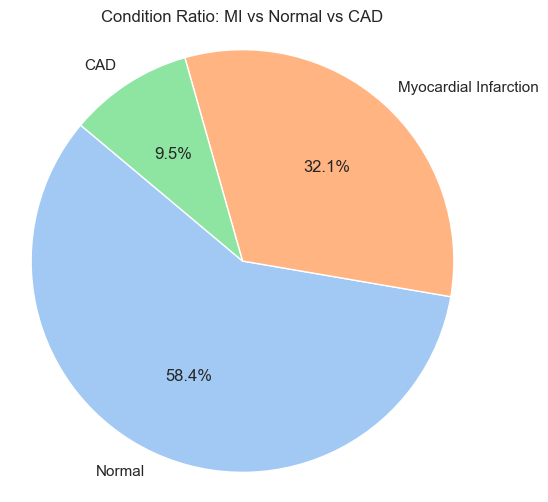

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



# Count the number of people per condition
condition_counts = df['condition'].value_counts()

# Prepare pie chart
colors = sns.color_palette("pastel")[:len(condition_counts)]
labels = condition_counts.index

plt.figure(figsize=(6, 6))
plt.pie(condition_counts,
        labels=labels,
        autopct='%1.1f%%',
        startangle=140,
        colors=colors)

plt.title("Condition Ratio: MI vs Normal vs CAD")
plt.axis('equal')
plt.show()


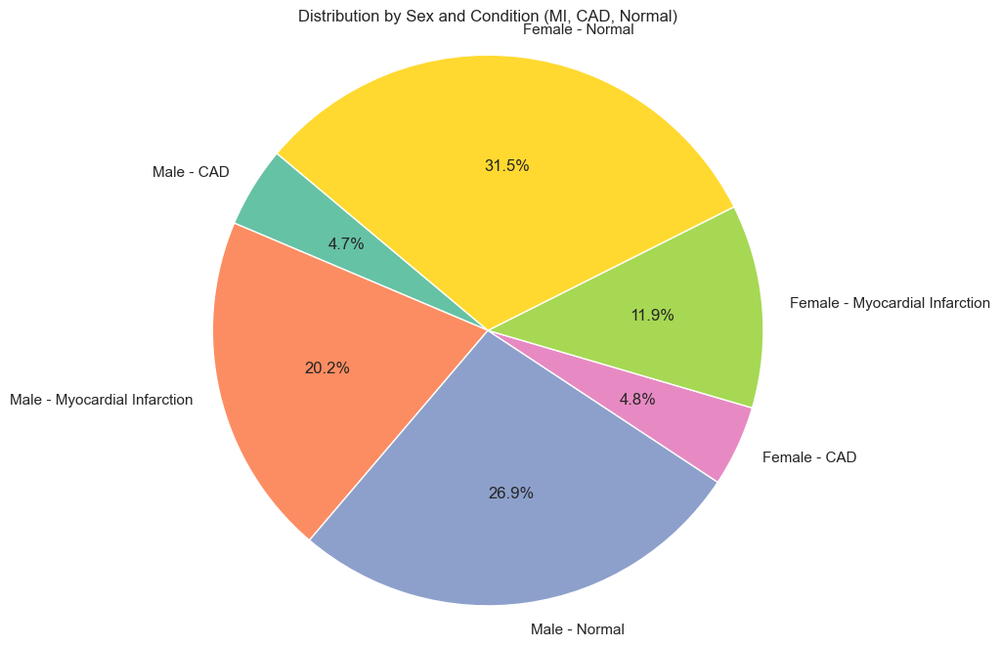

In [6]:




# Group by sex and condition
grouped_counts = df.groupby(['sex', 'condition']).size().unstack(fill_value=0)
grouped_counts.index = grouped_counts.index.map({0: 'Male', 1: 'Female'})

# Prepare labels and values
labels = [f"{sex} - {cond}" for sex in grouped_counts.index for cond in grouped_counts.columns]
values = [grouped_counts.loc[sex, cond] for sex in grouped_counts.index for cond in grouped_counts.columns]

# Plot pie chart
colors = sns.color_palette("Set2", len(labels))
plt.figure(figsize=(8, 8))
plt.pie(values, labels=labels, autopct='%1.1f%%', startangle=140, colors=colors)
plt.title("Distribution by Sex and Condition (MI, CAD, Normal)")
plt.axis('equal')
plt.show()


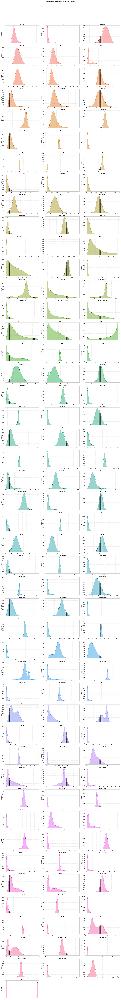

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Load dataset
df = pd.read_csv('ptbxl_features.csv')
# Select numerical columns only
numerical_df = df.select_dtypes(include=['float64', 'int64'])

# Set seaborn theme for style
sns.set(style="whitegrid")

# Choose a color palette
palette = sns.color_palette("husl", len(numerical_df.columns))  # vibrant colors

# Plot layout config
num_cols = numerical_df.columns
n_cols = 3
n_rows = math.ceil(len(num_cols) / n_cols)

# Plot
plt.figure(figsize=(22, n_rows * 4))

for i, col in enumerate(num_cols, 1):
    plt.subplot(n_rows, n_cols, i)
    color = palette[i % len(palette)]
    sns.histplot(numerical_df[col], kde=True, bins=30, color=color, edgecolor='black', linewidth=0.5)
    plt.title(f'{col}', fontsize=13, fontweight='bold')
    plt.xlabel('')
    plt.ylabel('Frequency')
    plt.grid(True, linestyle='--', alpha=0.4)

plt.suptitle('Individual Histograms for Numerical Features', fontsize=18, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()



C:\Users\Hajel\AppData\Local\Temp\ipykernel_17628\2092817044.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df, x=col, palette=palette, edgecolor="black")
C:\Users\Hajel\AppData\Local\Temp\ipykernel_17628\2092817044.py:26: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  ax = sns.countplot(data=df, x=col, palette=palette, edgecolor="black")


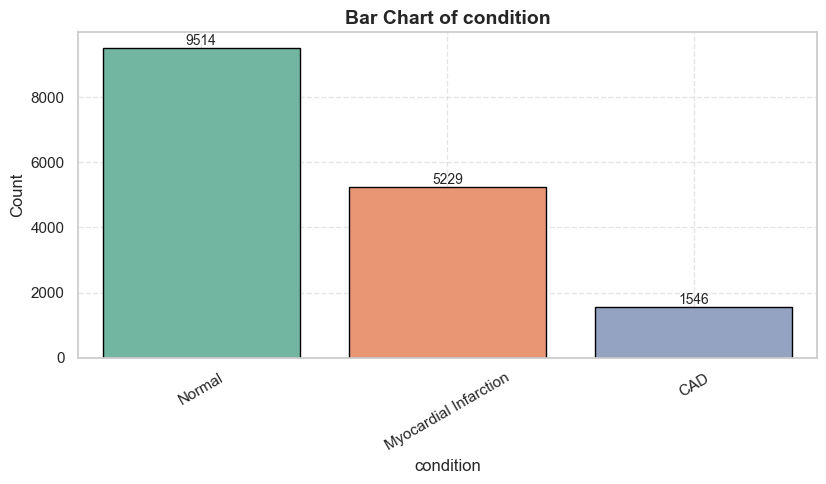

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Load dataset
df = pd.read_csv('ptbxl_features.csv')

# Select only categorical columns (type: object)
categorical_df = df.select_dtypes(include=['object'])

# Determine layout
num_cats = categorical_df.columns
n_cols = 2
n_rows = math.ceil(len(num_cats) / n_cols)

# Set visual style
sns.set(style="whitegrid")
palette = sns.color_palette("Set2")

# Plot
plt.figure(figsize=(16, n_rows * 5))

for i, col in enumerate(num_cats, 1):
    plt.subplot(n_rows, n_cols, i)
    ax = sns.countplot(data=df, x=col, palette=palette, edgecolor="black")
    plt.title(f'Bar Chart of {col}', fontsize=14, fontweight='bold')
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Count')
    plt.xticks(rotation=30)
    plt.grid(True, linestyle='--', alpha=0.5)
    
    # Add count labels
    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f'{int(height)}',
                    (p.get_x() + p.get_width() / 2, height),
                    ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()


In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import itertools

# Load dataset
df = pd.read_csv('ptbxl_features.csv')

# Get categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns

# Set seaborn style
sns.set(style="whitegrid")

# Iterate over all unique combinations of categorical variables
for x_var, hue_var in itertools.combinations(categorical_cols, 2):
    plt.figure(figsize=(10, 6))
    ax = sns.countplot(data=df, x=x_var, hue=hue_var, palette='Set3', edgecolor='black')
    
    # Add annotations
    for p in ax.patches:
        height = p.get_height()
        if height > 0:
            ax.annotate(f'{int(height)}',
                        (p.get_x() + p.get_width() / 2, height),
                        ha='center', va='bottom', fontsize=9)

    # Styling
    plt.title(f'{x_var} vs {hue_var}', fontsize=14, fontweight='bold')
    plt.xlabel(x_var)
    plt.ylabel('Count')
    plt.legend(title=hue_var)
    plt.xticks(rotation=30)
    plt.tight_layout()
    plt.show()

# Repeat in reverse to cover all combinations (hue vs x)
for x_var, hue_var in itertools.combinations(categorical_cols, 2):
    plt.figure(figsize=(10, 6))
    ax = sns.countplot(data=df, x=hue_var, hue=x_var, palette='Set2', edgecolor='black')
    
    # Add annotations
    for p in ax.patches:
        height = p.get_height()
        if height > 0:
            ax.annotate(f'{int(height)}',
                        (p.get_x() + p.get_width() / 2, height),
                        ha='center', va='bottom', fontsize=9)

    # Styling
    plt.title(f'{hue_var} vs {x_var}', fontsize=14, fontweight='bold')
    plt.xlabel(hue_var)
    plt.ylabel('Count')
    plt.legend(title=x_var)
    plt.xticks(rotation=30)
    plt.tight_layout()
    plt.show()


C:\Users\estya\AppData\Local\Temp\ipykernel_12124\1387470790.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=cat_col, y=num_col, palette='Set3', showfliers=True)
C:\Users\estya\AppData\Local\Temp\ipykernel_12124\1387470790.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=cat_col, y=num_col, palette='Set3', showfliers=True)
C:\Users\estya\AppData\Local\Temp\ipykernel_12124\1387470790.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=cat_col, y=num_col, palette='Set3', showfliers=True)
C:\Users\esty

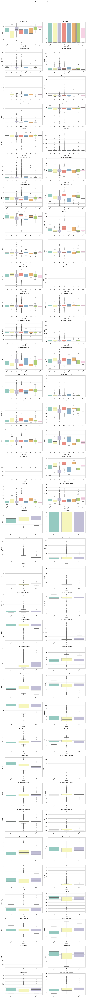

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import math

# Load the dataset
df = pd.read_csv('ptbxl_features.csv')

# Select categorical and numerical columns
categorical_cols = df.select_dtypes(include=['object']).columns
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns

# Generate all combinations of categorical x numerical
pairs = list(itertools.product(categorical_cols, numerical_cols))

# Set number of plots per row
plots_per_row = 2
n_rows = math.ceil(len(pairs) / plots_per_row)

# Set seaborn style
sns.set(style="whitegrid")
plt.figure(figsize=(plots_per_row * 8, n_rows * 5))

# Create subplots
for i, (cat_col, num_col) in enumerate(pairs, 1):
    plt.subplot(n_rows, plots_per_row, i)
    sns.boxplot(data=df, x=cat_col, y=num_col, palette='Set3', showfliers=True)
    plt.title(f'{num_col} by {cat_col}', fontsize=12, fontweight='bold')
    plt.xlabel(cat_col)
    plt.ylabel(num_col)
    plt.xticks(rotation=30)

plt.tight_layout()
plt.suptitle('Categorical vs Numerical (Box Plots)', fontsize=16, fontweight='bold', y=1.02)
plt.show()
# EDA ,Preprocessing,and Model Training

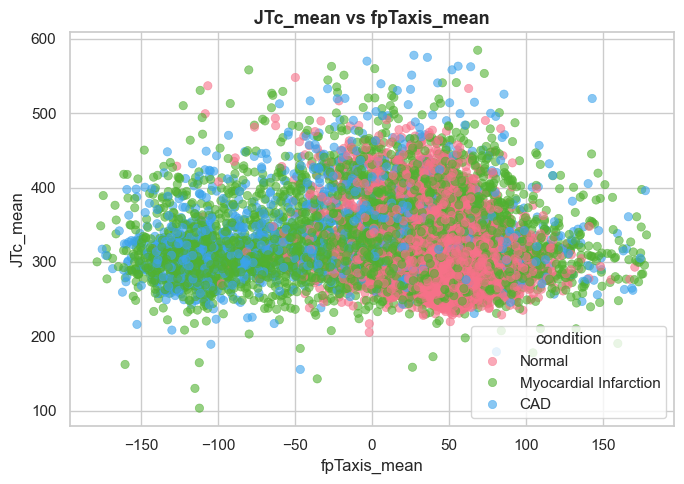

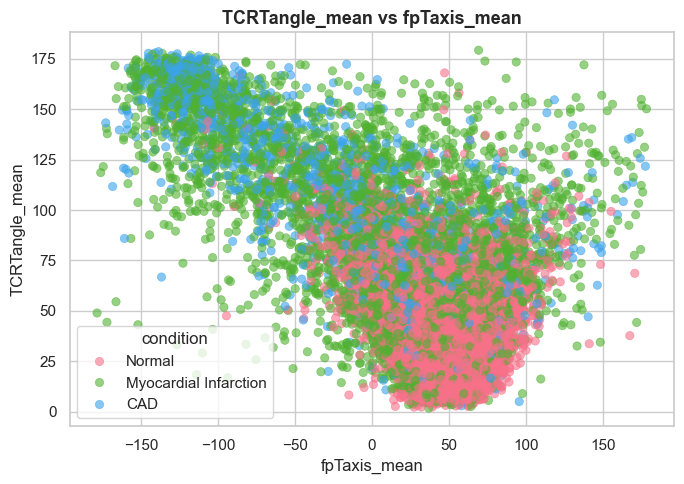

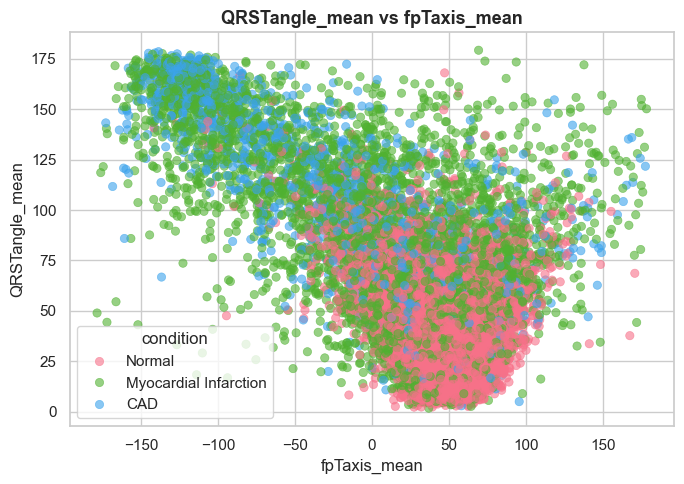

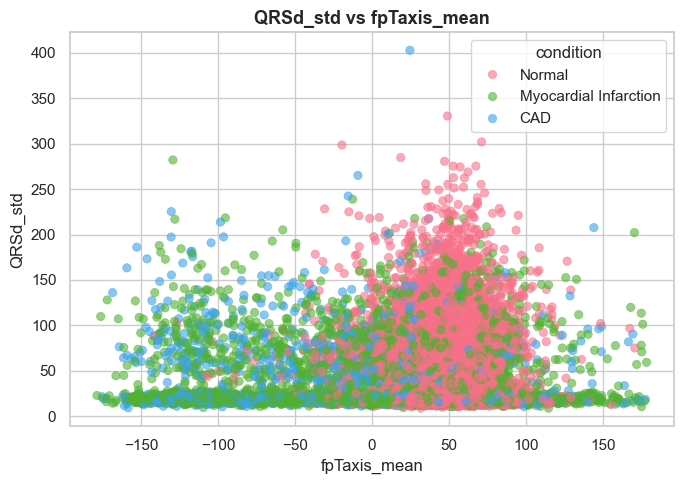

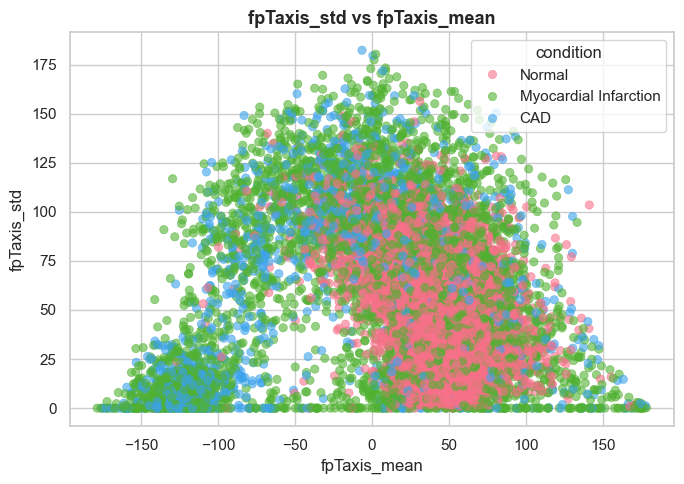

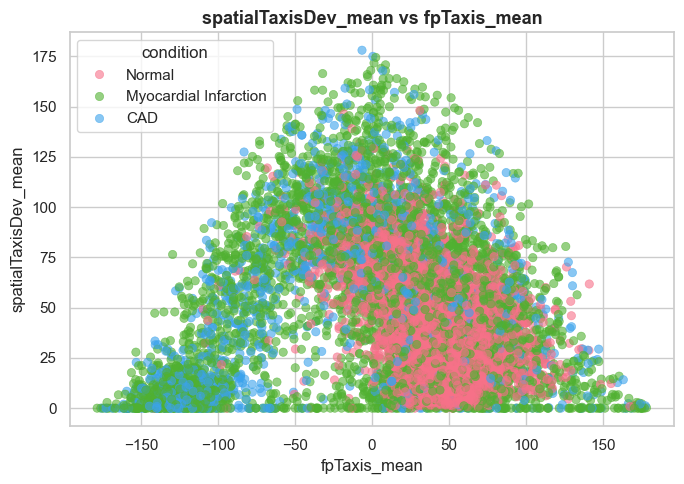

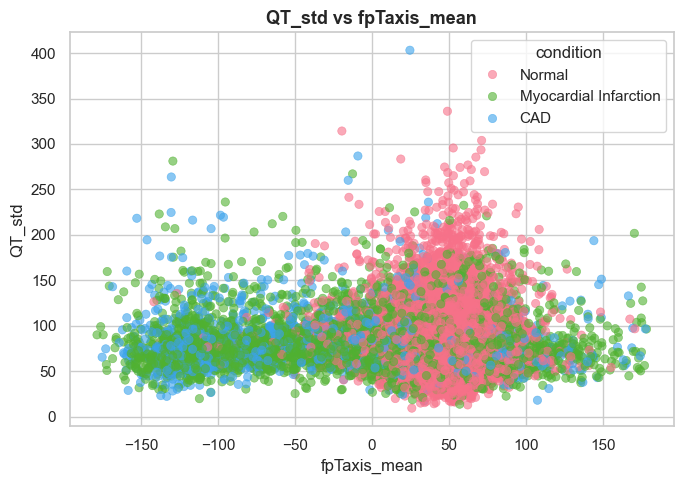

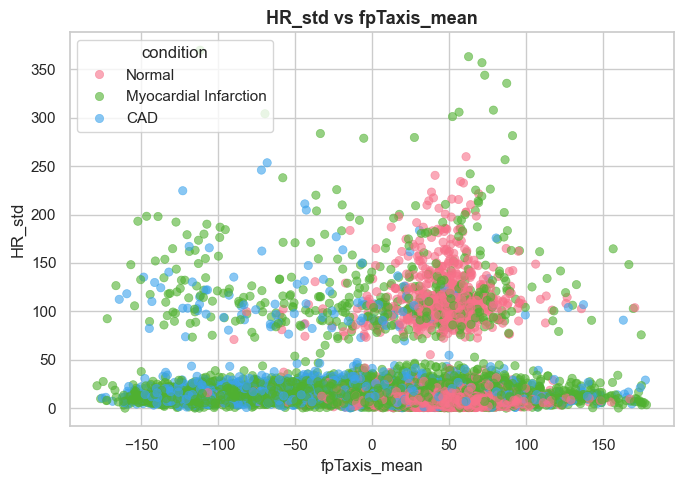

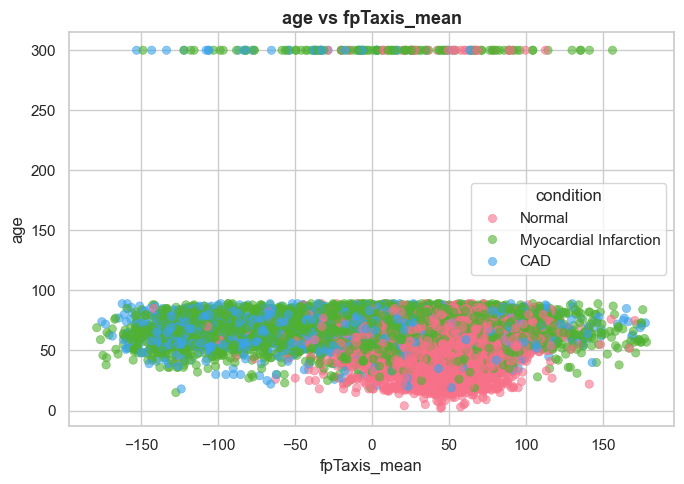

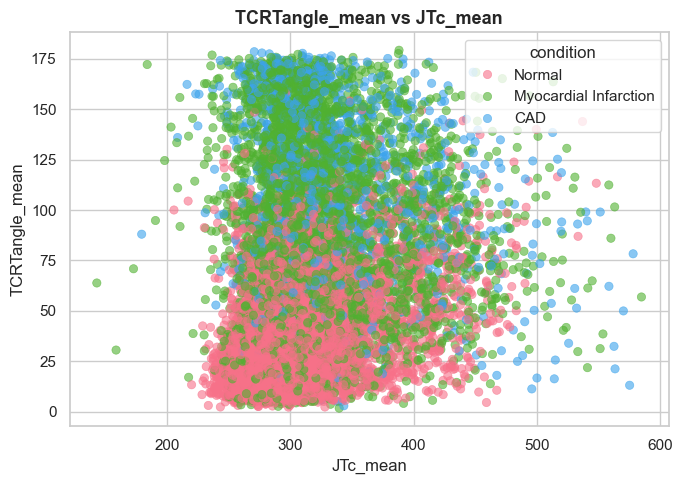

In [12]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import itertools

# Load dataset
df = pd.read_csv('ptbxl_features.csv')
# Select numerical columns
numerical_df = df.select_dtypes(include=['float64', 'int64'])

# Select top 10 numerical columns based on variance
top_numerical_cols = numerical_df.var().sort_values(ascending=False).head(10).index.tolist()

# Generate all unique pairs (without repetition)
pairs = list(itertools.combinations(top_numerical_cols, 2))[:10]  # limit to 10 pairs

# Optional hue for color distinction
hue_col = 'condition' if 'condition' in df.columns else None

# Set seaborn style
sns.set(style="whitegrid")

# Plot each scatter plot
for x_col, y_col in pairs:
    plt.figure(figsize=(7, 5))
    sns.scatterplot(data=df, x=x_col, y=y_col, hue=hue_col, palette="husl", alpha=0.6, edgecolor=None)
    plt.title(f'{y_col} vs {x_col}', fontsize=13, fontweight='bold')
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    if hue_col:
        plt.legend(title=hue_col)
    plt.tight_layout()
    plt.show()


C:\Users\Hajel\AppData\Local\Temp\ipykernel_17628\805711210.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=correlations.values, y=correlations.index, palette='viridis')


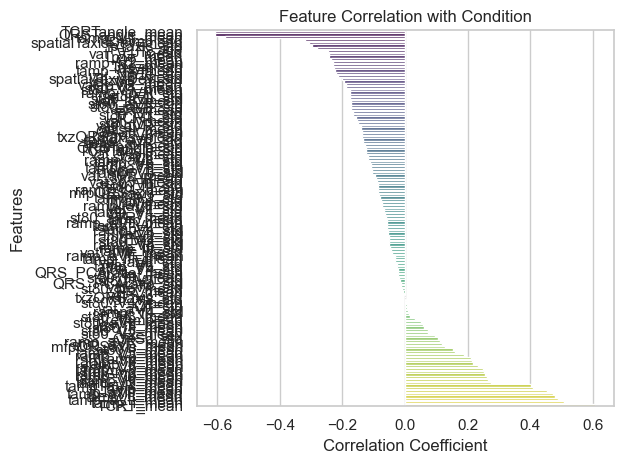

In [13]:
from sklearn.preprocessing import LabelEncoder
import numpy as np
# Encode target
df['condition_encoded'] = LabelEncoder().fit_transform(df['condition'])

# Compute correlations
correlations = df.select_dtypes(include=[np.number]).drop(columns=['condition_encoded']).apply(
    lambda x: x.corr(df['condition_encoded'])
).sort_values()

# Plot
sns.barplot(x=correlations.values, y=correlations.index, palette='viridis')
plt.title("Feature Correlation with Condition")
plt.xlabel("Correlation Coefficient")
plt.ylabel("Features")
plt.tight_layout()
plt.show()


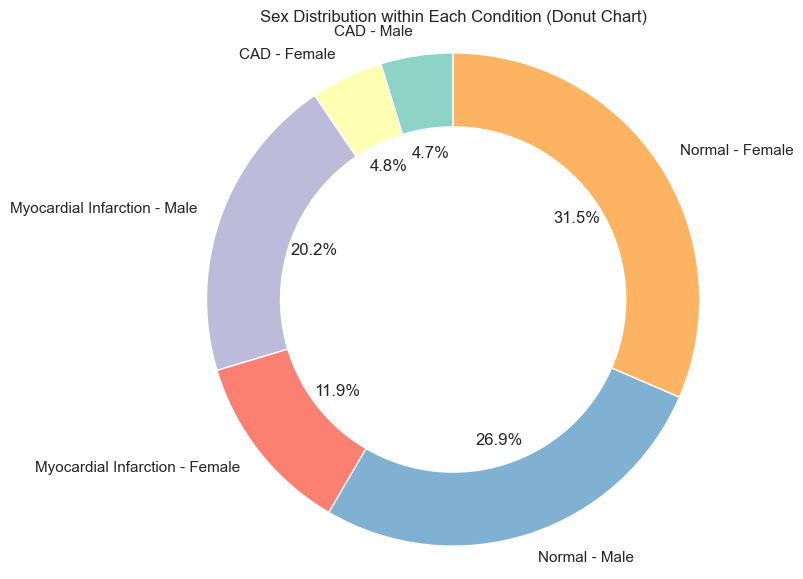

In [14]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your dataset
df = pd.read_csv('ptbxl_features.csv')

# Group and count
counts = df.groupby(['condition', 'sex']).size().unstack(fill_value=0)
labels = [f"{cond} - {'Male' if sex==0 else 'Female'}" for cond in counts.index for sex in [0,1]]
sizes = [counts.loc[cond, sex] for cond in counts.index for sex in [0,1]]

# Donut chart
colors = plt.cm.Set3.colors
plt.figure(figsize=(7, 7))
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90, wedgeprops=dict(width=0.3))
plt.title("Sex Distribution within Each Condition (Donut Chart)")
plt.axis('equal')
plt.show()


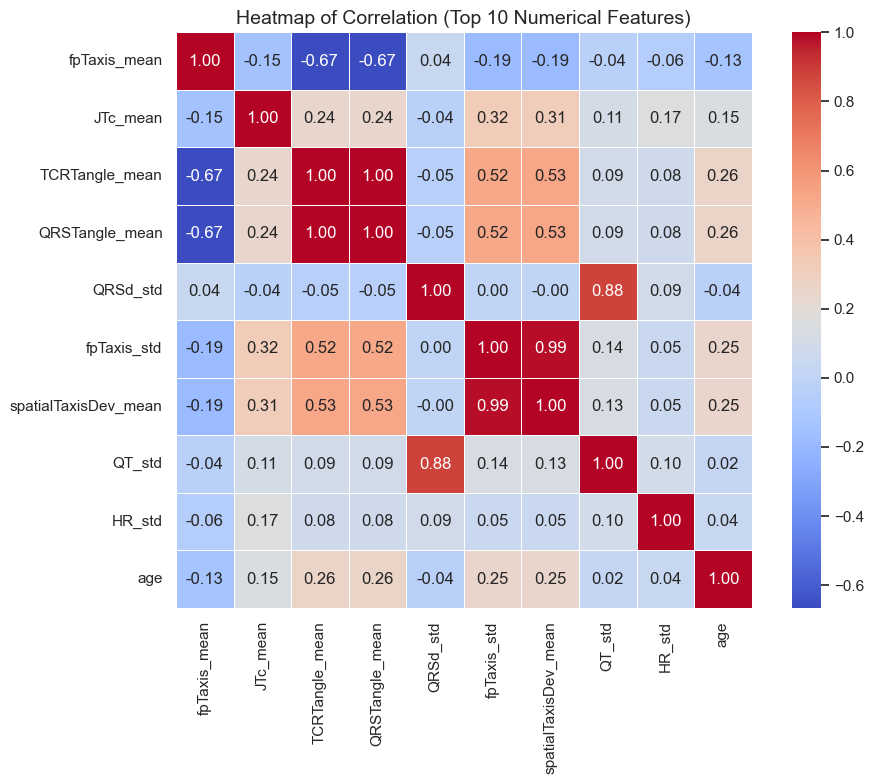

In [15]:
import seaborn as sns
import numpy as np

# Select top 10 high-variance numerical features
numerical_df = df.select_dtypes(include=['float64', 'int64'])
top_cols = numerical_df.var().sort_values(ascending=False).head(10).index
top_data = numerical_df[top_cols]

# Correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(top_data.corr(), annot=True, fmt=".2f", cmap="coolwarm", square=True, linewidths=.5)
plt.title("Heatmap of Correlation (Top 10 Numerical Features)", fontsize=14)
plt.tight_layout()
plt.show()


C:\Users\Hajel\AppData\Local\Temp\ipykernel_17628\1967546746.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x='condition', y='QT_mean', palette='Set2', inner='quartile')


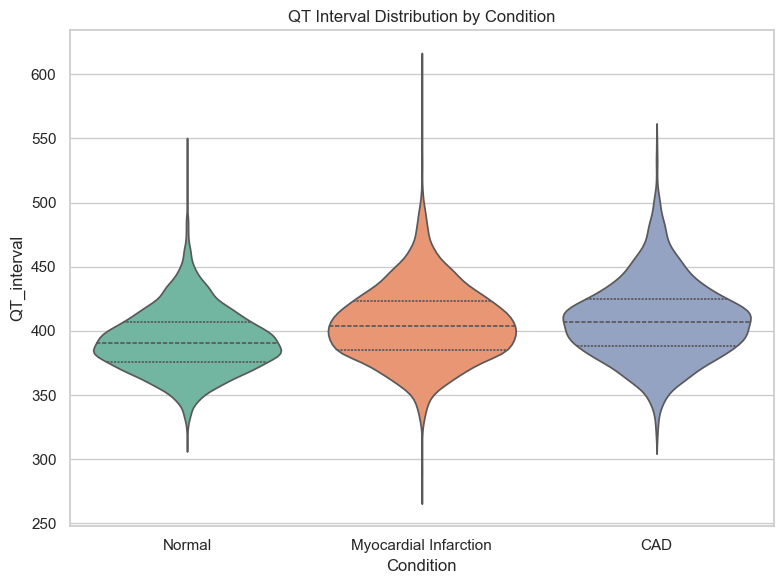

In [21]:
plt.figure(figsize=(8, 6))
sns.violinplot(data=df, x='condition', y='QT_mean', palette='Set2', inner='quartile')
plt.title('QT Interval Distribution by Condition')
plt.xlabel('Condition')
plt.ylabel('QT_interval')
plt.tight_layout()
plt.show()


C:\Users\Hajel\AppData\Local\Temp\ipykernel_17628\3213732369.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(data=df, x='condition', y='HR_mean', palette='husl', size=2, jitter=0.3)


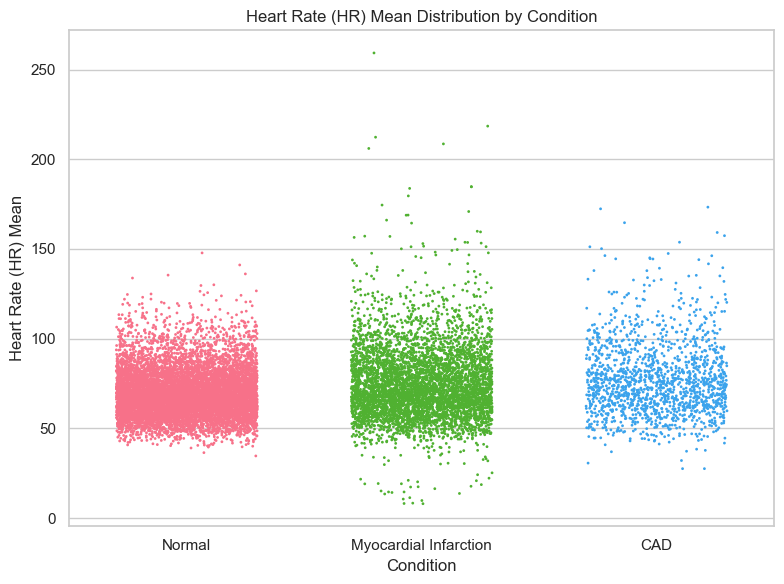

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
df = pd.read_csv('ptbxl_features.csv')


plt.figure(figsize=(8, 6))
sns.stripplot(data=df, x='condition', y='HR_mean', palette='husl', size=2, jitter=0.3)
plt.title('Heart Rate (HR) Mean Distribution by Condition')
plt.xlabel('Condition')
plt.ylabel('Heart Rate (HR) Mean')
plt.tight_layout()
plt.show()


C:\Users\Hajel\AppData\Local\Temp\ipykernel_17628\3428383757.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(data=df, x='condition', y='spatialTaxisDev_mean', palette='pastel')


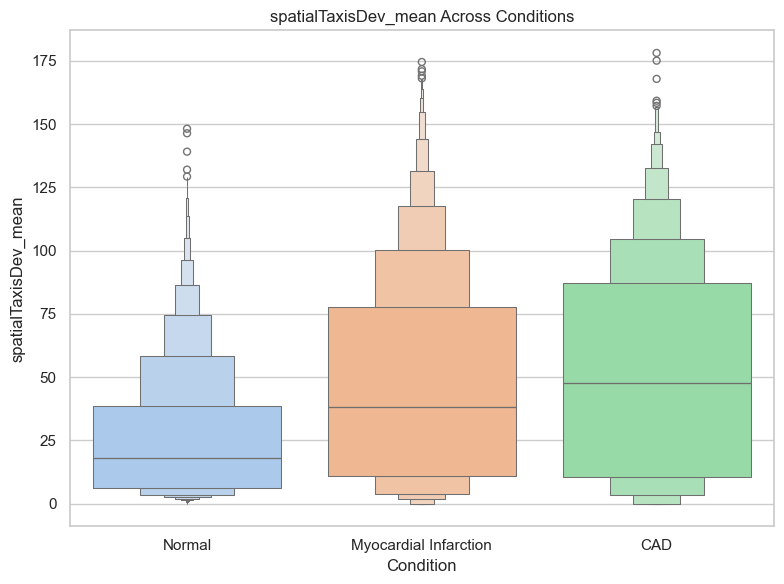

In [25]:
plt.figure(figsize=(8, 6))
sns.boxenplot(data=df, x='condition', y='spatialTaxisDev_mean', palette='pastel')
plt.title('spatialTaxisDev_mean Across Conditions')
plt.xlabel('Condition')
plt.ylabel('spatialTaxisDev_mean')
plt.tight_layout()
plt.show()
